<a href="https://colab.research.google.com/github/muniappabalaji/TimeSeries/blob/main/Multi_Variate_Time_Series_Recap_October2025.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Approach to Panama Electricity Forecast
1. Load the libraries and Data
2. Audit Check on the data
3. EDA
4. Time Series Decomposition
5. Stationarity
6. VAR
7. VECM
8. VARMA
9. Compare the results of VAR, VECM and VARMA
10. Apply Neural Networks to the data
11. Compare the results of VAR, VECM and VARMA with Neural Networks
12. Deploy the model with best results

Unzip The Data

In [ ]:
!unzip '/content/Panama Electricity Data.zip'

Archive:  /content/Panama Electricity Data.zip
  inflating: Predict_Jan.csv         
  inflating: Test_Jan.csv            
  inflating: train.csv               


Load the Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

Load the data

In [ ]:
df = pd.read_csv('/content/train.csv')

In [ ]:
display(df.head())
display(df.info())
display(df.describe())

,datetime,nat_demand,T2M_toc,QV2M_toc,TQL_toc,W2M_toc,T2M_san,QV2M_san,TQL_san,W2M_san,T2M_dav,QV2M_dav,TQL_dav,W2M_dav,Holiday_ID,holiday,school
0,03-01-2015 01:00,970.3450,25.865259,0.018576,0.016174,21.850546,23.482446,0.017272,0.001855,10.328949,22.662134,0.016562,0.096100,5.364148,0,0,0
1,03-01-2015 02:00,912.1755,25.899255,0.018653,0.016418,22.166944,23.399255,0.017265,0.001327,10.681517,22.578943,0.016509,0.087646,5.572471,0,0,0
2,03-01-2015 03:00,900.2688,25.937280,0.018768,0.015480,22.454911,23.343530,0.017211,0.001428,10.874924,22.531030,0.016479,0.078735,5.871184,0,0,0
3,03-01-2015 04:00,889.9538,25.957544,0.018890,0.016273,22.110481,23.238794,0.017128,0.002599,10.518620,22.512231,0.016487,0.068390,5.883621,0,0,0
4,03-01-2015 05:00,893.6865,25.973840,0.018981,0.017281,21.186089,23.075403,0.017059,0.001729,9.733589,22.481653,0.016456,0.064362,5.611724,0,0,0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43775 entries, 0 to 43774
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    43775 non-null  object 
 1   nat_demand  43775 non-null  float64
 2   T2M_toc     43775 non-null  float64
 3   QV2M_toc    43775 non-null  float64
 4   TQL_toc     43775 non-null  float64
 5   W2M_toc     43775 non-null  float64
 6   T2M_san     43775 non-null  float64
 7   QV2M_san    43775 non-null  float64
 8   TQL_san     43775 non-null  float64
 9   W2M_san     43775 non-null  float64
 10  T2M_dav     43775 non-null  float64
 11  QV2M_dav    43775 non-null  float64
 12  TQL_dav     43775 non-null  float64
 13  W2M_dav     43775 non-null  float64
 14  Holiday_ID  43775 non-null  int64  
 15  holiday     43775 non-null  int64  
 16  school      43775 non-null  int64  
dtypes: float64(13), int64(3), object(1)
memory usage: 5.7+ MB


None

,nat_demand,T2M_toc,QV2M_toc,TQL_toc,W2M_toc,T2M_san,QV2M_san,TQL_san,W2M_san,T2M_dav,QV2M_dav,TQL_dav,W2M_dav,Holiday_ID,holiday,school
count,43775.000000,43775.000000,43775.000000,43775.000000,43775.000000,43775.000000,43775.000000,43775.000000,43775.000000,43775.000000,43775.000000,43775.000000,43775.000000,43775.000000,43775.000000,43775.000000
mean,1184.102195,27.381070,0.018372,0.082358,13.018476,26.869752,0.017909,0.109571,6.934124,24.678938,0.016912,0.148480,3.562928,0.730828,0.062501,0.739600
std,193.512875,1.652179,0.001587,0.065835,7.151448,2.960669,0.001853,0.086249,4.055238,2.374089,0.001566,0.088259,1.709116,3.244740,0.242067,0.438858
min,85.192500,22.953455,0.012054,0.000000,0.008979,19.765222,0.010385,0.000009,0.060431,19.933740,0.009655,0.000051,0.015497,0.000000,0.000000,0.000000
25%,1017.453350,26.168436,0.017337,0.028423,7.387169,24.767938,0.016707,0.040314,3.912895,22.951654,0.015867,0.079285,2.301747,0.000000,0.000000,0.000000
50%,1173.251500,27.109338,0.018670,0.068237,11.767408,26.141260,0.018418,0.089752,5.888003,23.981989,0.017224,0.134277,3.408653,0.000000,0.000000,1.000000
75%,1332.279950,28.521463,0.019549,0.120148,18.038599,28.642450,0.019265,0.161377,9.151058,26.174570,0.018092,0.204773,4.652970,0.000000,0.000000,1.000000
max,1721.515700,35.039575,0.022690,0.521240,39.229726,39.063440,0.022011,0.484985,24.483937,34.216211,0.020958,0.477783,10.288902,22.000000,1.000000,1.000000


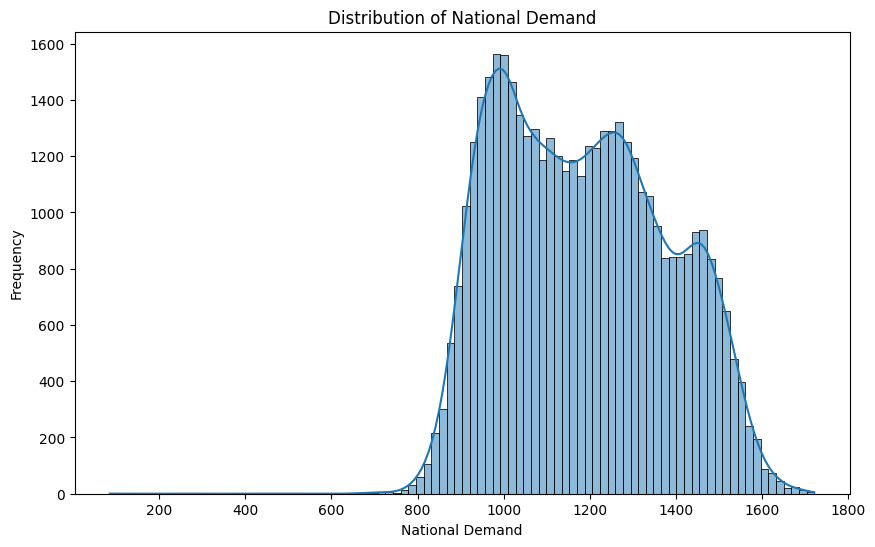

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(df['nat_demand'], kde=True)
plt.title('Distribution of National Demand')
plt.xlabel('National Demand')
plt.ylabel('Frequency')
plt.show()

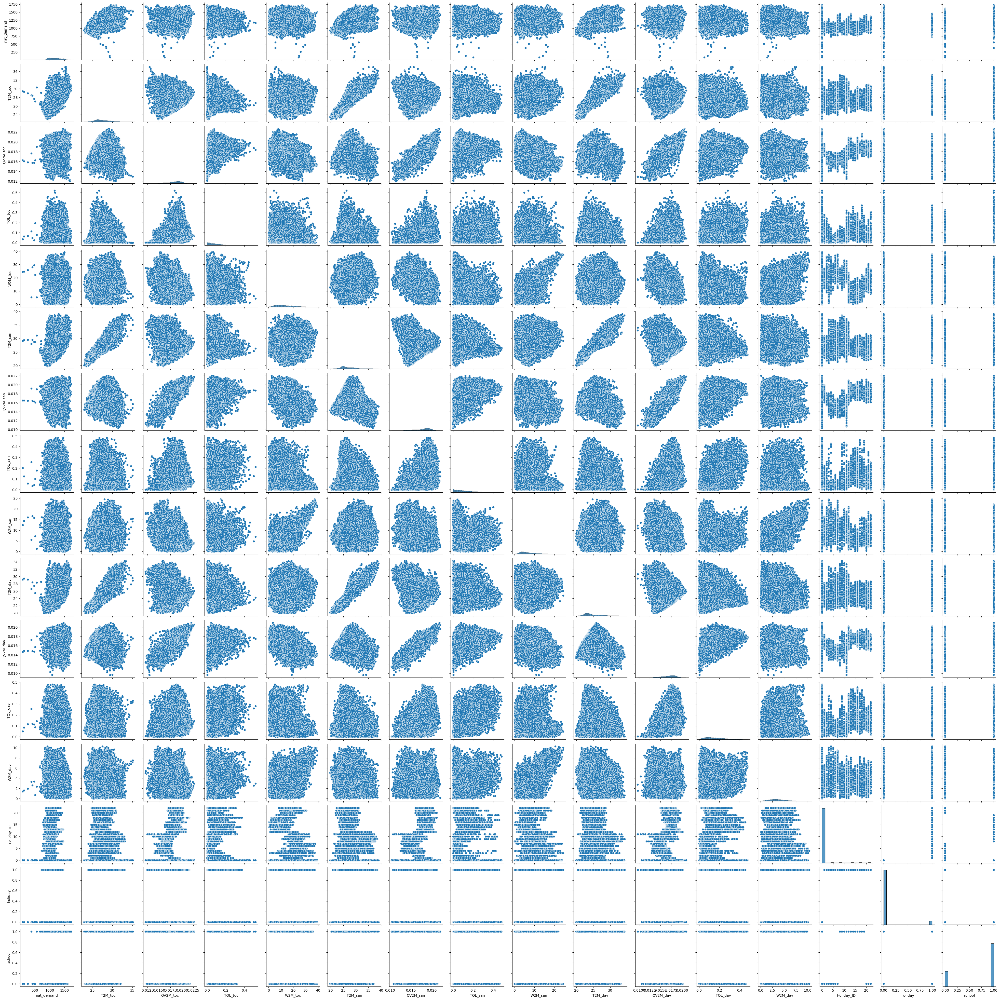

In [ ]:
sns.pairplot(df)

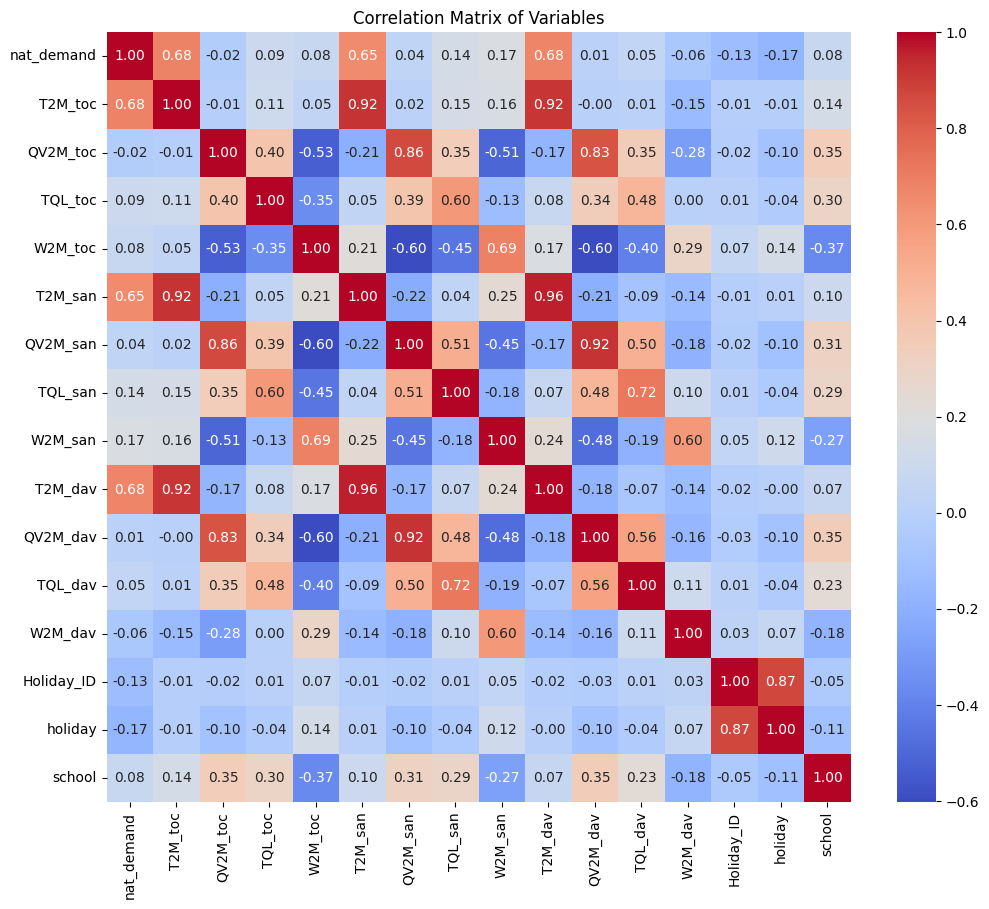

In [ ]:
df['datetime'] = pd.to_datetime(df['datetime'], format='%d-%m-%Y %H:%M')
plt.figure(figsize=(12, 10))
sns.heatmap(df.drop('datetime', axis=1).corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Variables')
plt.show()